<a href="https://colab.research.google.com/github/angel870326/Monthly-Revenue-Forecasting/blob/main/029_compare_results_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

> 2023.06.14 Ssu-Yun Wang<br/>
[Github @angel870326](https://github.com/angel870326)

# **Monthly Revenue Forecasting of Benchmark, Random Forest Regressor, XGB Regressor, RNN, LSTM & DNN with and without Incorporating Internet Search Volume - Comparison (2018-2022)**




### Contents

0. Setup
1. Input Data
2. MAE
  * 2.0 Select Score Type
  * 2.1 Calculate Mean & Standard Deviation
  * 2.2 Filter Top Models
  * 2.3 Plot by Year
  * 2.4 Plot Benchmark by Year (*new)
3. MAE%
  * 3.0 Select Score Type
  * 3.1 Calculate Mean & Standard Deviation
  * 3.2 Filter Top Models
  * 3.3 Plot by Year
  * 3.4 Plot Benchmark by Year (*new)
4. Plot Monthly Revenue by Year



## **0. Setup**

In [1]:
# sConnect to the Google Drive
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## **1. Input Data**


In [3]:
path = '/content/gdrive/Shareddrives/Me/論文/Results'

### **1.1 Original**


In [4]:
category = 2013

def getScores(modelName: str):
    if modelName == 'benchmark':
        scores = pd.read_excel(os.path.join(path, f'benchmark/scores_{modelName}_{category}.xlsx'), index_col = 0)
    else:
        scores = pd.read_excel(os.path.join(path, f'{category}/scores_{modelName}_{category}.xlsx'), index_col = 0)
    return scores

In [5]:
scores_rf = getScores('rf')
scores_xgb = getScores('xgb')
scores_rnn = getScores('rnn')
scores_lstm = getScores('lstm')
scores_dnn = getScores('dnn')
scores_benchmark = getScores('benchmark')

In [6]:
print(scores_rf.shape)
print(scores_xgb.shape)
print(scores_rnn.shape)
print(scores_lstm.shape)
print(scores_dnn.shape)
print(scores_benchmark.shape)

(60, 24)
(60, 24)
(60, 24)
(60, 24)
(60, 24)
(60, 4)


### **1.2 With Search Volume**
2023.06.14


In [7]:
category_sv = 'search_volume'

def getScoresSV(modelName: str, sv_type: str):
    scores = pd.read_excel(os.path.join(path, f'{category_sv}/{sv_type}/scores_{modelName}_{category_sv}_{sv_type}.xlsx'), index_col = 0)
    return scores

In [8]:
scores_rf_sv = {'mean': getScoresSV('rf', 'mean'),
                't-1': getScoresSV('rf', 't-1')
                }
scores_xgb_sv = {'mean': getScoresSV('xgb', 'mean'),
                 't-1': getScoresSV('xgb', 't-1')
                 }
scores_rnn_sv = {'mean': getScoresSV('rnn', 'mean'),
                 't-1': getScoresSV('rnn', 't-1')
                 }
scores_lstm_sv = {'mean': getScoresSV('lstm', 'mean'),
                  't-1': getScoresSV('lstm', 't-1')
                  }
scores_dnn_sv = {'mean': getScoresSV('dnn', 'mean'),
                 't-1': getScoresSV('dnn', 't-1')
                 }

In [9]:
print(scores_rf_sv['mean'].shape)
print(scores_xgb_sv['mean'].shape)
print(scores_rnn_sv['mean'].shape)
print(scores_lstm_sv['mean'].shape)
print(scores_dnn_sv['mean'].shape)
print(scores_rf_sv['t-1'].shape)
print(scores_xgb_sv['t-1'].shape)
print(scores_rnn_sv['t-1'].shape)
print(scores_lstm_sv['t-1'].shape)
print(scores_dnn_sv['t-1'].shape)

(60, 24)
(60, 24)
(60, 24)
(60, 24)
(60, 24)
(60, 24)
(60, 24)
(60, 24)
(60, 24)
(60, 24)


## **2. MAE**

In [10]:
output_path = '/content/gdrive/Shareddrives/Me/論文/Compare'

### **2.0 Select Score Type**

2023.06.14 updated for search volume

In [13]:
def selectScoreType(scoreD: pd.DataFrame, scoreType: str, modelName: str, sv: bool = False, sv_type: str = ""):
    col = [col for col in scoreD.columns if f'{scoreType}-' in col]
    df = scoreD[col]
    if sv == False:
        if modelName == 'Benchmark':
            df.columns = [modelName]
        else:
            df.columns = [modelName + ' - ' + s for s in ['org', 'def', 'dec', 'dec_def', 'season_adj', 'season_def']]
    else:   # search volume
        df.columns = [modelName + f' (SV: {sv_type})' + ' - ' + s for s in ['org', 'def', 'dec', 'dec_def', 'season_adj', 'season_def']]

    return df

def concatScores(scoreType: str):
    rf = selectScoreType(scores_rf, scoreType, 'Random Forest')
    xgb = selectScoreType(scores_xgb, scoreType, 'XGB')
    rnn = selectScoreType(scores_rnn, scoreType, 'RNN')
    lstm = selectScoreType(scores_lstm, scoreType, 'LSTM')
    dnn = selectScoreType(scores_dnn, scoreType, 'DNN')
    benchmark = selectScoreType(scores_benchmark, scoreType, 'Benchmark')
    # Search volume - mean
    rf_sv_mean = selectScoreType(scores_rf_sv['mean'], scoreType, 'Random Forest', True, 'mean')
    xgb_sv_mean = selectScoreType(scores_xgb_sv['mean'], scoreType, 'XGB', True, 'mean')
    rnn_sv_mean = selectScoreType(scores_rnn_sv['mean'], scoreType, 'RNN', True, 'mean')
    lstm_sv_mean = selectScoreType(scores_lstm_sv['mean'], scoreType, 'LSTM', True, 'mean')
    dnn_sv_mean = selectScoreType(scores_dnn_sv['mean'], scoreType, 'DNN', True, 'mean')
    # Search volume - t-1
    rf_sv_t_1 = selectScoreType(scores_rf_sv['t-1'], scoreType, 'Random Forest', True, 't-1')
    xgb_sv_t_1 = selectScoreType(scores_xgb_sv['t-1'], scoreType, 'XGB', True, 't-1')
    rnn_sv_t_1 = selectScoreType(scores_rnn_sv['t-1'], scoreType, 'RNN', True, 't-1')
    lstm_sv_t_1 = selectScoreType(scores_lstm_sv['t-1'], scoreType, 'LSTM', True, 't-1')
    dnn_sv_t_1 = selectScoreType(scores_dnn_sv['t-1'], scoreType, 'DNN', True, 't-1')

    concat = pd.concat([benchmark, rf, xgb, rnn, lstm, dnn, rf_sv_mean, xgb_sv_mean, rnn_sv_mean, lstm_sv_mean, dnn_sv_mean, rf_sv_t_1, xgb_sv_t_1, rnn_sv_t_1, lstm_sv_t_1, dnn_sv_t_1], axis=1)
    # concat = pd.concat([rf, xgb], axis=1)
    return concat

In [14]:
mae = concatScores('MAE')
mae

,Benchmark,Random Forest - org,Random Forest - def,Random Forest - dec,Random Forest - dec_def,Random Forest - season_adj,Random Forest - season_def,XGB - org,XGB - def,XGB - dec,...,LSTM (SV: t-1) - dec,LSTM (SV: t-1) - dec_def,LSTM (SV: t-1) - season_adj,LSTM (SV: t-1) - season_def,DNN (SV: t-1) - org,DNN (SV: t-1) - def,DNN (SV: t-1) - dec,DNN (SV: t-1) - dec_def,DNN (SV: t-1) - season_adj,DNN (SV: t-1) - season_def
2018-01,1024039,398399,240879,420289,273549,387840,233186,330349,212174,358017,...,275741,211055,355493,242807,277778,252347,312317,308485,391252,237372
2018-02,374468,264191,252623,293304,272306,273152,401686,242034,291795,316114,...,253726,299577,261856,360589,282270,226389,291903,261046,296425,309017
2018-03,447286,262229,172643,311624,215438,279766,263927,234903,207098,339650,...,231309,215846,306528,270345,225804,232822,266355,229492,273647,288791
2018-04,351256,290365,144183,335629,174977,306170,235749,267589,141005,309584,...,236053,161131,257964,241975,266178,222853,249476,327824,274744,280961
2018-05,205134,302027,145711,337588,166675,323104,225644,332902,127773,300582,...,238472,140574,312421,244211,211099,236650,204014,148759,367423,229707
2018-06,211394,318040,199209,371169,195801,328463,253668,276458,159087,323473,...,253004,164241,297824,265867,238134,163222,223969,164696,274838,227765
2018-07,213870,306893,140574,344646,146315,319697,183798,301514,139722,279895,...,199465,149707,277406,187121,224485,140811,241867,147203,236334,188586
2018-08,162810,303746,178119,353948,187452,334085,242148,294736,151054,346162,...,213249,175615,283783,218851,201065,181402,198053,169714,258236,220178
2018-09,241857,382812,247428,426595,239270,422414,293841,318330,192041,322252,...,242692,203842,366539,280968,254535,253840,267634,212197,347599,268714
2018-10,325551,390725,268484,443226,282619,408452,355234,365194,209365,436838,...,237799,223225,366462,378132,229862,408532,249277,231533,411760,409307


In [ ]:
mae.to_excel(os.path.join(output_path, f'{category_sv}/mae_{category_sv}.xlsx'))

### **2.1 Calculate Mean & Standard Deviation**

In [11]:
def calculateMeanStd(scoreD: pd.DataFrame, percent: bool=False):
    if percent == True:
        digit = 4
    else:
        digit = 0

    mean = round(scoreD.mean(axis=0), digit)
    std = round(scoreD.std(axis=0), digit)
    min = round(scoreD.min(axis=0), digit)
    median = round(scoreD.median(axis=0), digit)
    max = round(scoreD.max(axis=0), digit)
    mean_std = pd.concat([mean, std, min, median, max], axis=1)
    mean_std.columns = ['mean', 'std', 'min', 'median', 'max']

    mean_std['mean_rank'] = mean_std['mean'].rank(ascending=True)
    mean_std['std_rank'] = mean_std['std'].rank(ascending=True)
    mean_std['min_rank'] = mean_std['min'].rank(ascending=True)
    mean_std['median_rank'] = mean_std['median'].rank(ascending=True)
    mean_std['max_rank'] = mean_std['max'].rank(ascending=True)

    if percent == True:
        mean_std = mean_std.astype(float)
    else:
        mean_std = mean_std.astype(int)

    index_split = pd.Series(mean_std.index).str.split(" - ", expand=True)
    mean_std = mean_std.reset_index(drop=True)
    # mean_std[['modelName', 'dataType']] = mean_std['index'].str.split(" - ", expand=True)
    mean_std.insert(loc=0, column='Model', value = index_split[0])
    mean_std.insert(loc=1, column='Data Type', value = index_split[1])

    return mean_std

In [15]:
mae_mean_std = calculateMeanStd(mae)
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       ):
    display(mae_mean_std)

,Model,Data Type,mean,std,min,median,max,mean_rank,std_rank,min_rank,median_rank,max_rank
0,Benchmark,None,327931,145843,149319,304452,1024039,58,85,31,59,91
1,Random Forest,org,378229,99491,236181,344412,624279,69,57,73,66,52
2,Random Forest,def,230414,79998,126433,211038,469726,7,9,15,7,3
3,Random Forest,dec,442163,119148,257956,419219,753829,83,76,85,84,72
4,Random Forest,dec_def,246577,81225,141820,228251,490914,24,17,24,23,14
5,Random Forest,season_adj,402303,111376,245015,371465,690128,79,69,79,75,60
6,Random Forest,season_def,298432,77550,183798,287740,489999,31,2,51,44,13
7,XGB,org,385053,113232,220116,385674,792473,72,71,69,80,79
8,XGB,def,220569,85188,115374,205221,500250,2,33,2,3,23
9,XGB,dec,451682,151733,270762,427594,911565,86,86,90,88,84


In [ ]:
mae_mean_std.to_excel(os.path.join(output_path, f'{category_sv}/mae_mean_std_{category_sv}.xlsx'), index = False)

### **2.2 Filter Top Models**

In [16]:
# Filter top models
def topModel(mean_std: pd.DataFrame):
    top = mean_std[(mean_std['mean_rank'] <= 30) & (mean_std['median_rank'] <= 30)]
    return top

In [17]:
mae_top = topModel(mae_mean_std)
mae_top

,Model,Data Type,mean,std,min,median,max,mean_rank,std_rank,min_rank,median_rank,max_rank
2,Random Forest,def,230414,79998,126433,211038,469726,7,9,15,7,3
4,Random Forest,dec_def,246577,81225,141820,228251,490914,24,17,24,23,14
8,XGB,def,220569,85188,115374,205221,500250,2,33,2,3,23
10,XGB,dec_def,237226,85022,141850,218577,489779,15,32,25,17,12
14,RNN,def,238448,81869,131933,222086,522052,17,21,19,19,31
16,RNN,dec_def,238811,84167,116678,214418,495796,19,29,4,12,19
20,LSTM,def,234290,74622,134356,218132,470101,12,1,22,15,4
22,LSTM,dec_def,239325,93841,132049,224983,560480,20,48,20,20,40
26,DNN,def,233600,82769,118886,220928,481209,11,24,10,18,7
28,DNN,dec_def,234501,82086,119973,208638,501851,13,22,11,5,24


In [ ]:
mae_top.to_excel(os.path.join(output_path, f'{category_sv}/mae_top_{category_sv}.xlsx'), index = False)

### **2.3 Plot by Year**

2023.06.14 updated for search volume

In [18]:
import itertools

In [19]:
# 根據不同年份畫出單一模型單一資料類型的單一預測分數
def plotSingleModelScoreByYear(modelName: str, dataType: str, scoreD: pd.DataFrame, percent: bool = False, sv: bool = False, sv_type: str = "", linestyle: str = '-', details: str = ""):
    if sv == False:
        scores = scoreD[f'{modelName} - {dataType}']
    else:
        scores = scoreD[f'{modelName} (SV: {sv_type}) - {dataType}']

    months = list(range(1,13))
    # Plot
    plt.plot(months, scores[0:12], label = f'2018{details}', linestyle = linestyle, color = 'C0')
    plt.plot(months, scores[12:24], label = f'2019{details}', linestyle = linestyle, color = 'C1')
    plt.plot(months, scores[24:36], label = f'2020{details}', linestyle = linestyle, color = 'C2')
    plt.plot(months, scores[36:48], label = f'2021{details}', linestyle = linestyle, color = 'C3')
    plt.plot(months, scores[48:60], label = f'2022{details}', linestyle = linestyle, color = 'C4')

    plt.xticks(months)
    if percent == True:
        plt.yticks(np.arange(0.05, 0.3, 0.05))
    else:
        plt.yticks(range(100000, 650000, 50000))

    # Reorder legend
    handles, labels = plt.gca().get_legend_handles_labels()
    def flip(items, ncol):
        return itertools.chain(*[items[i::ncol] for i in range(ncol)])
    plt.legend(flip(handles, 5), flip(labels, 5), ncol=5, loc = 'upper left')

In [20]:
# 根據不同年份畫出單一模型平減資料和拆解後平減資料的單一預測分數
def plotModelScoreByYear(modelName: str, scoreD: pd.DataFrame, scoreType: str, percent: bool = False, sv: bool = False, sv_type: str = ""):
    if sv == False:
        details = ""
    else:
        details = f" (SV: {sv_type})"

    plt.figure(figsize = (15,4))
    # deflating
    plt.subplot(1,2,1)
    plt.title(f"{scoreType} of {modelName}{details} with Deflating Data", size = 14)
    plotSingleModelScoreByYear(modelName, 'def', scoreD, percent, sv, sv_type)
    # decomposed + deflating
    plt.subplot(1,2,2)
    plt.title(f"{scoreType} of {modelName}{details} with Deflating Decomposed Data", size = 14)
    plotSingleModelScoreByYear(modelName, 'dec_def', scoreD, percent, sv, sv_type)
    plt.show()

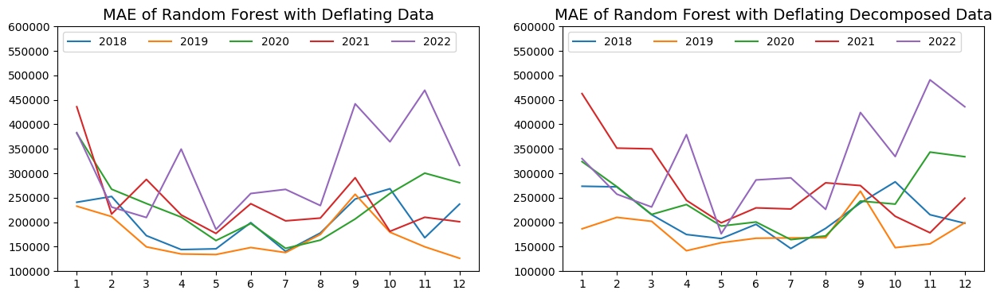

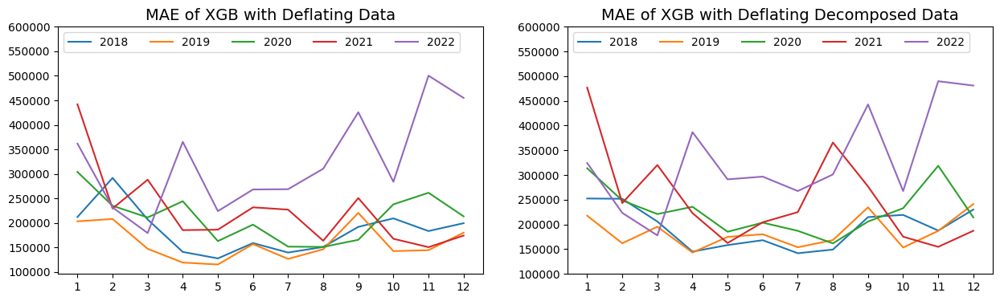

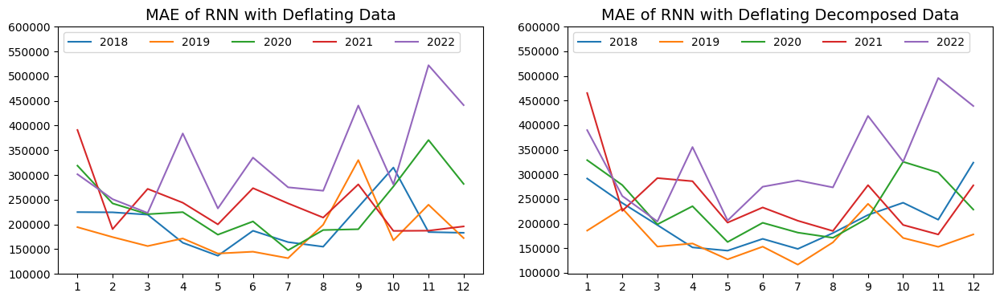

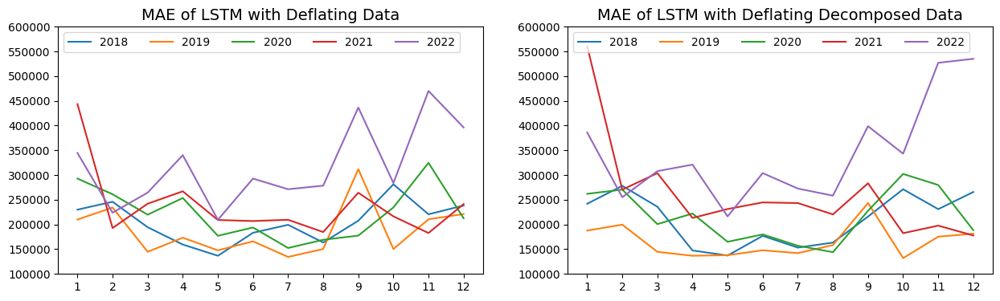

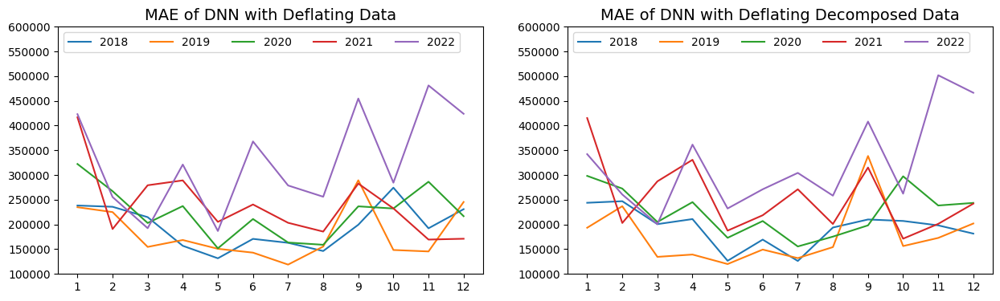

In [21]:
# Original
plotModelScoreByYear('Random Forest', mae, 'MAE')
plotModelScoreByYear('XGB', mae, 'MAE')
plotModelScoreByYear('RNN', mae, 'MAE')
plotModelScoreByYear('LSTM', mae, 'MAE')
plotModelScoreByYear('DNN', mae, 'MAE')

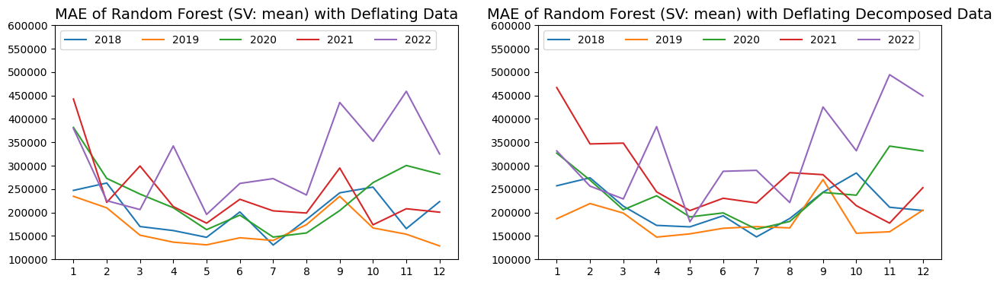

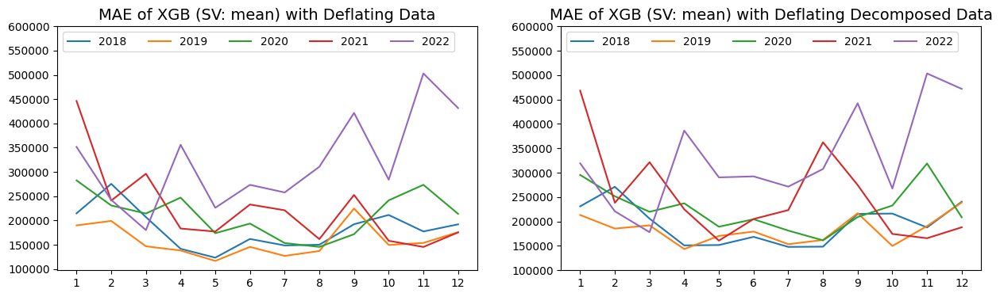

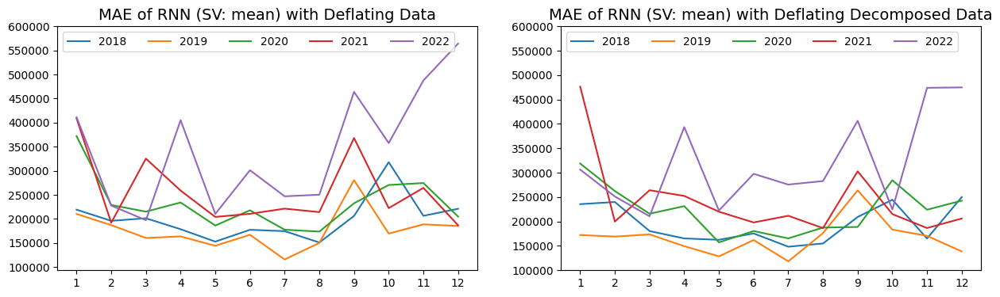

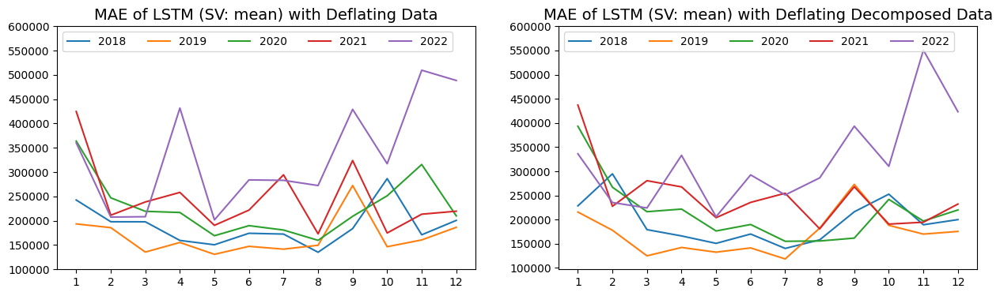

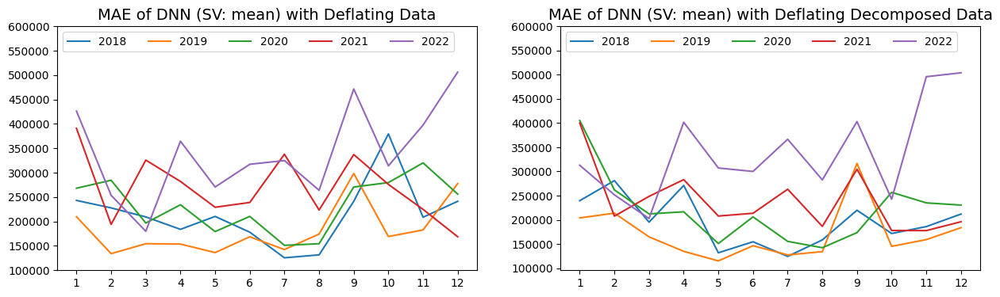

In [22]:
# Search volume: mean
plotModelScoreByYear('Random Forest', mae, 'MAE', sv = True, sv_type = 'mean')
plotModelScoreByYear('XGB', mae, 'MAE', sv = True, sv_type = 'mean')
plotModelScoreByYear('RNN', mae, 'MAE', sv = True, sv_type = 'mean')
plotModelScoreByYear('LSTM', mae, 'MAE', sv = True, sv_type = 'mean')
plotModelScoreByYear('DNN', mae, 'MAE', sv = True, sv_type = 'mean')

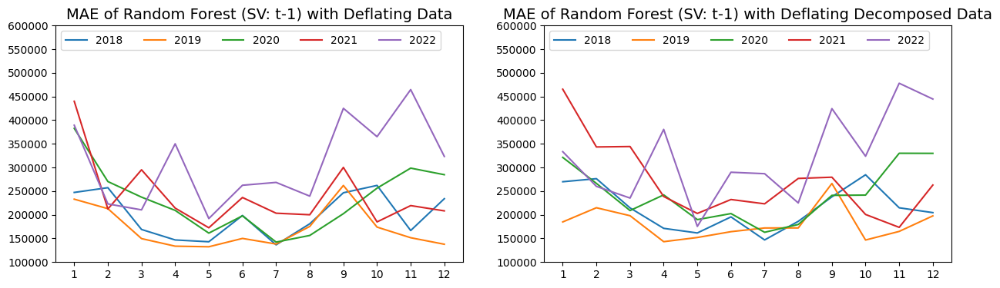

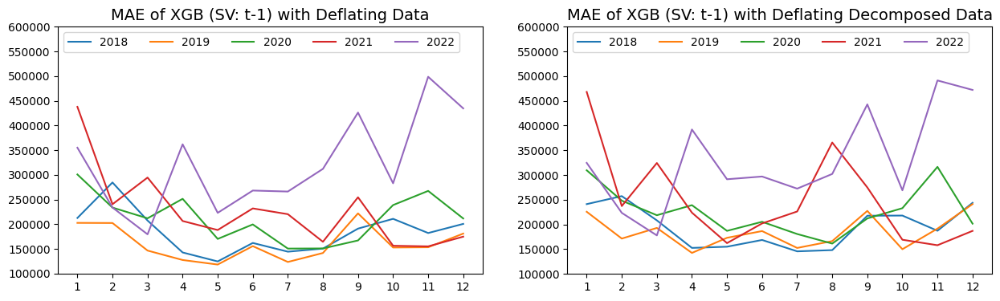

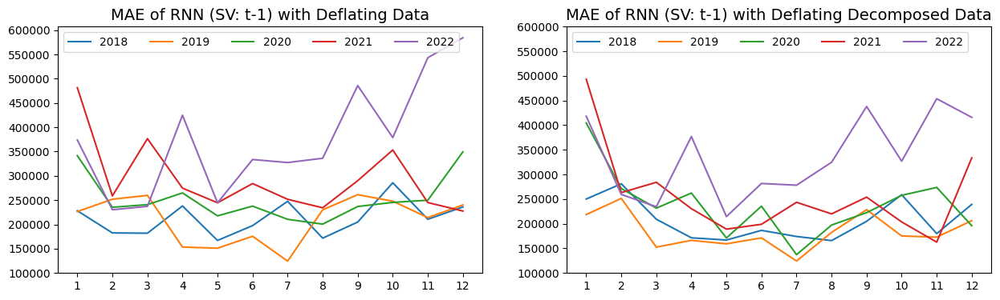

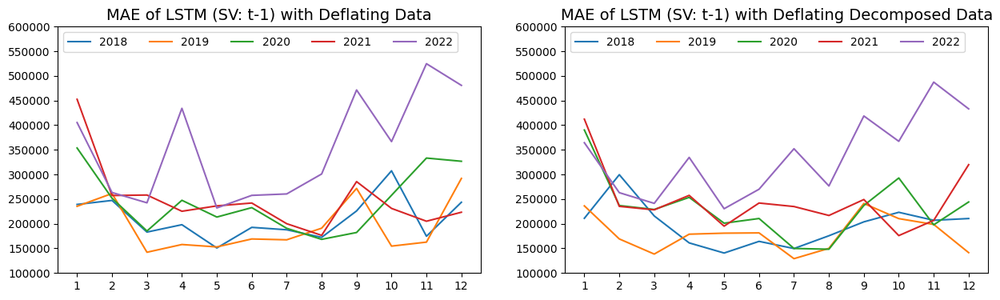

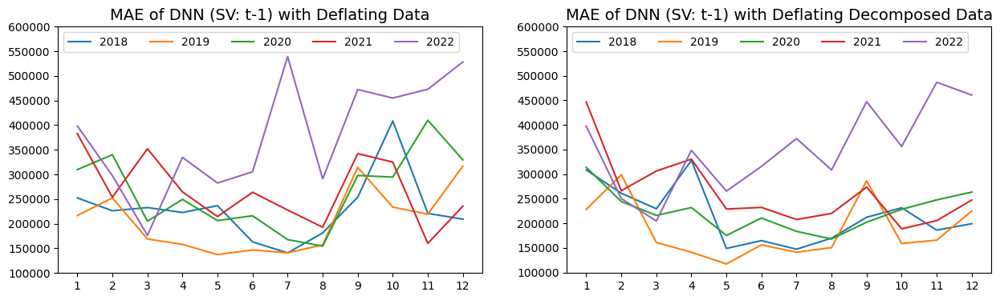

In [23]:
# Search volume: t-1
plotModelScoreByYear('Random Forest', mae, 'MAE', sv = True, sv_type = 't-1')
plotModelScoreByYear('XGB', mae, 'MAE', sv = True, sv_type = 't-1')
plotModelScoreByYear('RNN', mae, 'MAE', sv = True, sv_type = 't-1')
plotModelScoreByYear('LSTM', mae, 'MAE', sv = True, sv_type = 't-1')
plotModelScoreByYear('DNN', mae, 'MAE', sv = True, sv_type = 't-1')

### **2.4 Plot Benchmark by Year**

2023.06.01

In [ ]:
# 根據不同年份畫出 Benchmark 的單一預測分數
def plotBenchmarkScoreByYear( scoreD: pd.DataFrame, scoreType: str, percent: bool=False):
    scores = scoreD['Benchmark']
    months = list(range(1,13))
    # Plot
    plt.figure(figsize = (15,6))
    plt.title(f"{scoreType} of Benchmark", size = 14)
    plt.plot(months, scores[0:12], label = '2018')
    plt.plot(months, scores[12:24], label = '2019')
    plt.plot(months, scores[24:36], label = '2020')
    plt.plot(months, scores[36:48], label = '2021')
    plt.plot(months, scores[48:60], label = '2022')

    plt.xticks(months)
    if percent == True:
        plt.yticks(np.arange(0.05, 0.6, 0.05))
    else:
        plt.yticks(range(100000, 1100000, 50000))
    plt.legend(ncol=5, loc = 'upper left')
    plt.show()

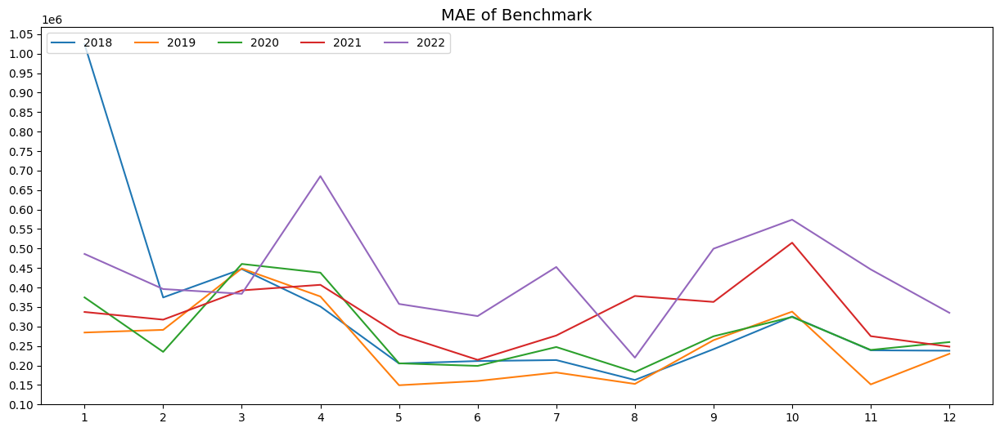

In [ ]:
plotBenchmarkScoreByYear(mae, 'MAE')

### **2.5 Comparison of `Search Volume - Mean` and `Search Volume - t-1`**

2023.06.14

In [36]:
def plotModelScoreComparisonByYear(modelName: str, scoreD: pd.DataFrame, scoreType: str, percent: bool = False, sv_1: bool = False, sv_type_1: str = "", sv_2: bool = False, sv_type_2: str = ""):
    if sv_1 == False:
        details_1 = " (no SV)"
    else:
        details_1 = f" (SV: {sv_type_1})"
    if sv_2 == False:
        details_2 = " (no SV)"
    else:
        details_2 = f" (SV: {sv_type_2})"

    plt.figure(figsize = (26,6))
    # deflating
    plt.subplot(1,2,1)
    plt.title(f"{scoreType} of {modelName} with Deflating Data", size = 14)
    plotSingleModelScoreByYear(modelName, 'def', scoreD, percent, sv_1, sv_type_1, '-', details_1)
    plotSingleModelScoreByYear(modelName, 'def', scoreD, percent, sv_2, sv_type_2, '--', details_2)

    # decomposed + deflating
    plt.subplot(1,2,2)
    plt.title(f"{scoreType} of {modelName} with Deflating Decomposed Data", size = 14)
    plotSingleModelScoreByYear(modelName, 'dec_def', scoreD, percent, sv_1, sv_type_1, '-', details_1)
    plotSingleModelScoreByYear(modelName, 'dec_def', scoreD, percent, sv_2, sv_type_2, '--', details_2)

    plt.show()

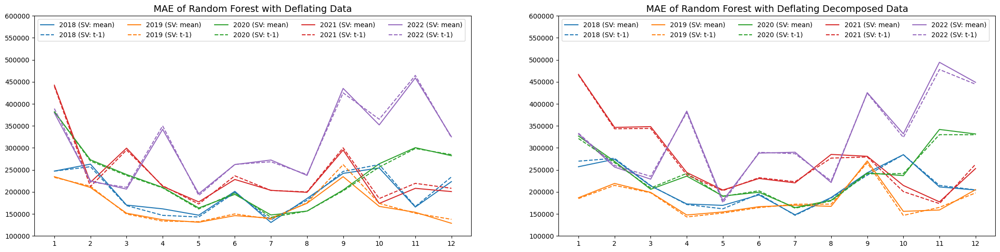

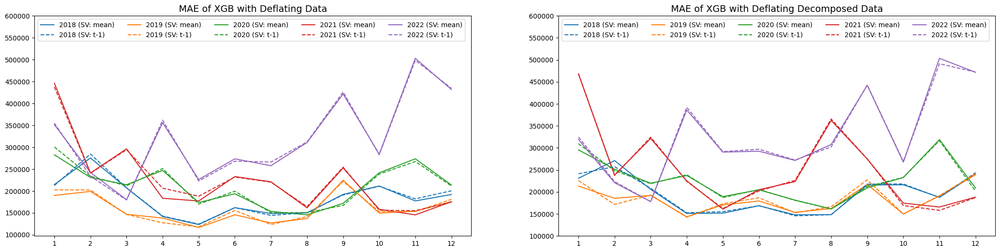

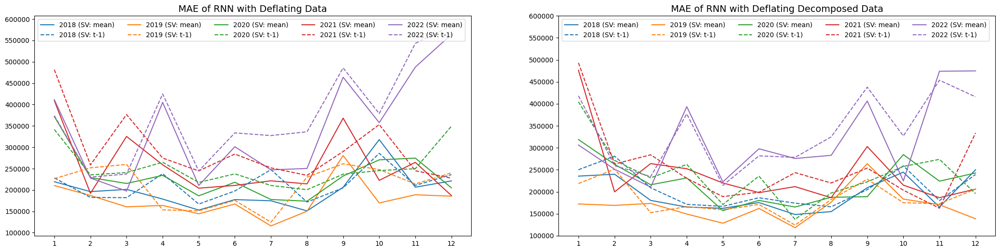

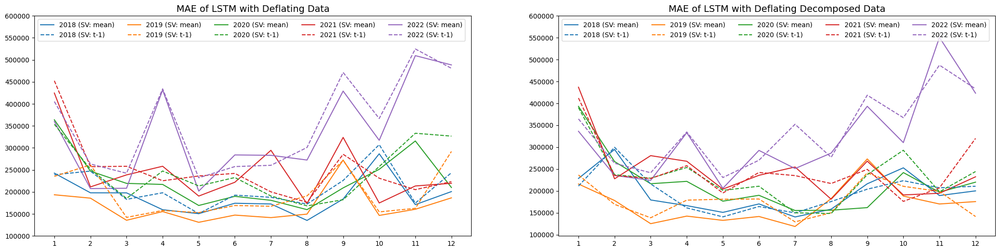

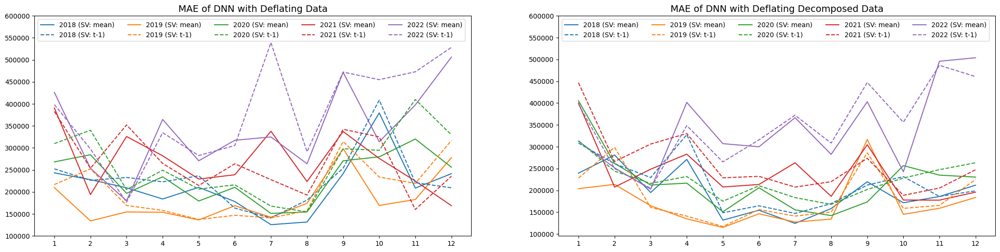

In [34]:
plotModelScoreComparisonByYear('Random Forest', mae, 'MAE', sv_1 = True, sv_type_1 = 'mean', sv_2 = True, sv_type_2 = 't-1')
plotModelScoreComparisonByYear('XGB', mae, 'MAE', sv_1 = True, sv_type_1 = 'mean', sv_2 = True, sv_type_2 = 't-1')
plotModelScoreComparisonByYear('RNN', mae, 'MAE', sv_1 = True, sv_type_1 = 'mean', sv_2 = True, sv_type_2 = 't-1')
plotModelScoreComparisonByYear('LSTM', mae, 'MAE', sv_1 = True, sv_type_1 = 'mean', sv_2 = True, sv_type_2 = 't-1')
plotModelScoreComparisonByYear('DNN', mae, 'MAE', sv_1 = True, sv_type_1 = 'mean', sv_2 = True, sv_type_2 = 't-1')

### **2.6 Comparison of `Original` and `Search Volume - Mean`**

2023.06.14

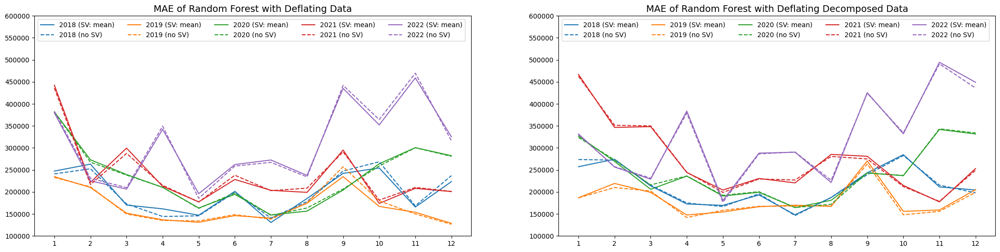

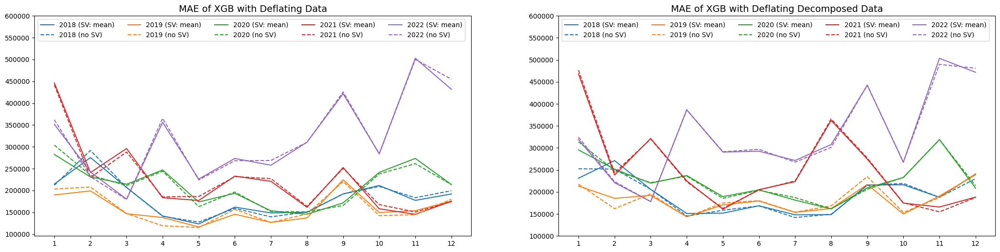

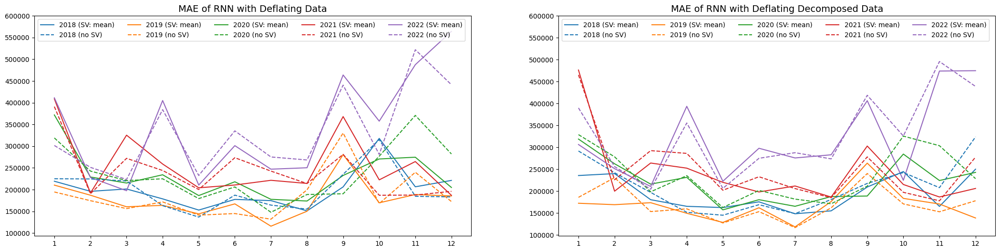

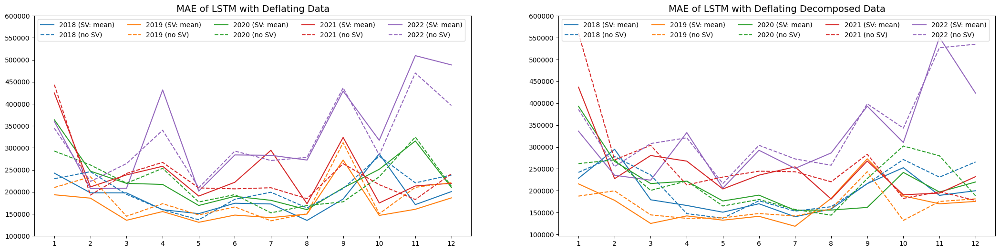

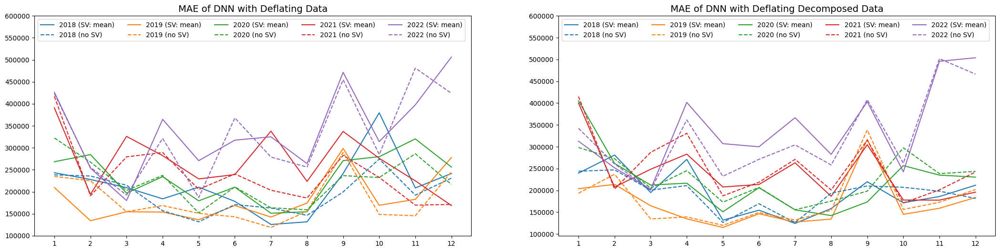

In [37]:
plotModelScoreComparisonByYear('Random Forest', mae, 'MAE', sv_1 = True, sv_type_1 = 'mean')
plotModelScoreComparisonByYear('XGB', mae, 'MAE', sv_1 = True, sv_type_1 = 'mean')
plotModelScoreComparisonByYear('RNN', mae, 'MAE', sv_1 = True, sv_type_1 = 'mean')
plotModelScoreComparisonByYear('LSTM', mae, 'MAE', sv_1 = True, sv_type_1 = 'mean')
plotModelScoreComparisonByYear('DNN', mae, 'MAE', sv_1 = True, sv_type_1 = 'mean')

### **2.7 Compare the Mean Scores of Top Models**

2023.06.15

In [44]:
def compareTopModel(topModel: pd.DataFrame):
    topModel = topModel.reset_index()
    df1 = topModel.loc[0:9, ['Model', 'Data Type', 'mean']]
    df2 = topModel.loc[10:19, ['mean']]['mean'].rename('mean of SV - mean').reset_index(drop = True)
    df3 = topModel.loc[20:29, ['mean']]['mean'].rename('mean of SV - t-1').reset_index(drop = True)
    compare_df = pd.concat([df1, df2, df3], axis = 1)
    return compare_df


def plotSingleCompareTopModel(top_compare: pd.DataFrame, data_type: str, ax = None, percent: bool = False):
    x = 'Model'
    y = ['mean', 'mean of SV - mean', 'mean of SV - t-1']
    kind = 'bar'

    if data_type == 'def':
        top_compare.iloc[0::2].plot(x = x, y = y, kind = kind, ax = ax, label = ['No SV', 'SV: mean', 'SV: t-1'])

    elif data_type == 'dec_def':
        top_compare.iloc[1::2].plot(x = x, y = y, kind = kind, ax = ax, label = ['No SV', 'SV: mean', 'SV: t-1'])

    if percent == True:
        ax.tick_params(axis = 'x', rotation = 0)
        ax.set_ylim(0.10, 0.130)
        ax.set_yticks(np.arange(0.10, 0.130, 0.005))
    else:
        ax.tick_params(axis = 'x', rotation = 0)
        ax.set_ylim(200000, 280000)
        ax.set_yticks(range(200000, 280000, 10000))

    ax.legend(ncol = 3, loc = 'upper left')


def plotCompareTopModel(top_compare: pd.DataFrame, scoreType: str, percent: bool = False):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
    # deflating
    axes[0].set_title(f"{scoreType} of Different Models with Deflating Data", size = 14)
    plotSingleCompareTopModel(top_compare, 'def', axes[0], percent)
    # decomposed + deflating
    axes[1].set_title(f"{scoreType} of Different Models with Deflating Decomposed Data", size = 14)
    plotSingleCompareTopModel(top_compare, 'dec_def', axes[1], percent)

    plt.show()

In [45]:
mae_top_compare = compareTopModel(mae_top)
mae_top_compare

,Model,Data Type,mean,mean of SV - mean,mean of SV - t-1
0,Random Forest,def,230414,229575,230648
1,Random Forest,dec_def,246577,247369,245982
2,XGB,def,220569,219575,220972
3,XGB,dec_def,237226,236719,237267
4,RNN,def,238448,241986,269012
5,RNN,dec_def,238811,228970,244303
6,LSTM,def,234290,232527,250970
7,LSTM,dec_def,239325,229986,238714
8,DNN,def,233600,248501,269404
9,DNN,dec_def,234501,232924,247782


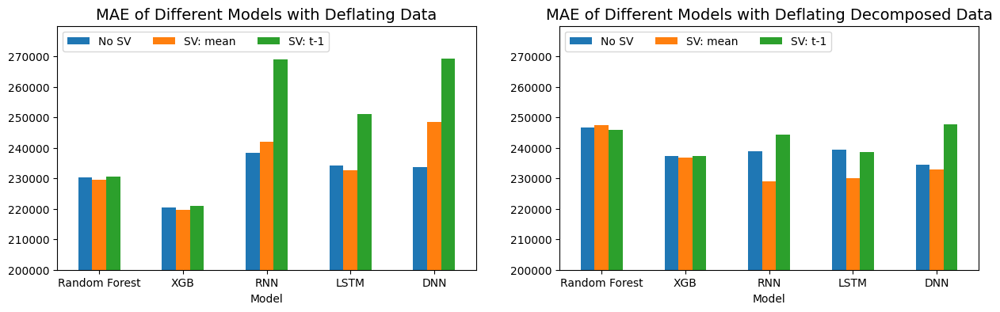

In [46]:
# Plot
plotCompareTopModel(mae_top_compare, 'MAE')

## **3. MAE%**

### **3.0 Select Score Type**

In [47]:
mae_p = concatScores('MAE%')
mae_p

,Benchmark,Random Forest - org,Random Forest - def,Random Forest - dec,Random Forest - dec_def,Random Forest - season_adj,Random Forest - season_def,XGB - org,XGB - def,XGB - dec,...,LSTM (SV: t-1) - dec,LSTM (SV: t-1) - dec_def,LSTM (SV: t-1) - season_adj,LSTM (SV: t-1) - season_def,DNN (SV: t-1) - org,DNN (SV: t-1) - def,DNN (SV: t-1) - dec,DNN (SV: t-1) - dec_def,DNN (SV: t-1) - season_adj,DNN (SV: t-1) - season_def
2018-01,0.5257,0.2045,0.1237,0.2158,0.1404,0.1991,0.1197,0.1696,0.1089,0.1838,...,0.1416,0.1084,0.1825,0.1247,0.1426,0.1296,0.1603,0.1584,0.2009,0.1219
2018-02,0.2513,0.1773,0.1695,0.1968,0.1827,0.1833,0.2696,0.1624,0.1958,0.2121,...,0.1703,0.2010,0.1757,0.2420,0.1894,0.1519,0.1959,0.1752,0.1989,0.2074
2018-03,0.2382,0.1397,0.0920,0.1660,0.1147,0.1490,0.1406,0.1251,0.1103,0.1809,...,0.1232,0.1150,0.1633,0.1440,0.1203,0.1240,0.1419,0.1222,0.1458,0.1538
2018-04,0.1958,0.1619,0.0804,0.1871,0.0976,0.1707,0.1314,0.1492,0.0786,0.1726,...,0.1316,0.0898,0.1438,0.1349,0.1484,0.1243,0.1391,0.1828,0.1532,0.1566
2018-05,0.1083,0.1595,0.0770,0.1783,0.0880,0.1706,0.1192,0.1758,0.0675,0.1587,...,0.1259,0.0742,0.1650,0.1290,0.1115,0.1250,0.1077,0.0786,0.1940,0.1213
2018-06,0.1104,0.1661,0.1040,0.1939,0.1023,0.1716,0.1325,0.1444,0.0831,0.1689,...,0.1321,0.0858,0.1555,0.1389,0.1244,0.0852,0.1170,0.0860,0.1435,0.1190
2018-07,0.1087,0.1559,0.0714,0.1751,0.0743,0.1624,0.0934,0.1532,0.0710,0.1422,...,0.1013,0.0761,0.1409,0.0951,0.1140,0.0715,0.1229,0.0748,0.1201,0.0958
2018-08,0.0791,0.1475,0.0865,0.1719,0.0910,0.1623,0.1176,0.1432,0.0734,0.1681,...,0.1036,0.0853,0.1378,0.1063,0.0977,0.0881,0.0962,0.0824,0.1254,0.1069
2018-09,0.1083,0.1715,0.1108,0.1911,0.1072,0.1892,0.1316,0.1426,0.0860,0.1443,...,0.1087,0.0913,0.1642,0.1258,0.1140,0.1137,0.1199,0.0950,0.1557,0.1204
2018-10,0.1422,0.1706,0.1172,0.1936,0.1234,0.1784,0.1551,0.1595,0.0914,0.1908,...,0.1038,0.0975,0.1600,0.1651,0.1004,0.1784,0.1089,0.1011,0.1798,0.1787


In [ ]:
mae_p.to_excel(os.path.join(output_path, f'{category_sv}/mae_p_{category_sv}.xlsx'))

### **3.1 Calculate Mean & Standard Deviation**

In [48]:
mae_p_mean_std = calculateMeanStd(mae_p, True)
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       ):
    display(mae_p_mean_std)

,Model,Data Type,mean,std,min,median,max,mean_rank,std_rank,min_rank,median_rank,max_rank
0,Benchmark,None,0.1544,0.0720,0.0694,0.1414,0.5257,58.0,91.0,30.0,54.0,91.0
1,Random Forest,org,0.1746,0.0313,0.1256,0.1688,0.2709,69.0,3.5,75.0,70.0,39.0
2,Random Forest,def,0.1077,0.0359,0.0597,0.1006,0.2222,7.5,24.5,7.0,10.0,20.0
3,Random Forest,dec,0.2034,0.0338,0.1489,0.1937,0.2868,83.0,11.0,89.0,83.0,46.0
4,Random Forest,dec_def,0.1153,0.0362,0.0662,0.1064,0.2103,25.0,30.0,26.0,24.0,9.0
5,Random Forest,season_adj,0.1852,0.0340,0.1304,0.1771,0.2893,78.5,13.0,81.0,80.0,50.5
6,Random Forest,season_def,0.1405,0.0403,0.0846,0.1322,0.2907,33.0,46.0,43.0,37.0,54.0
7,XGB,org,0.1780,0.0419,0.1172,0.1708,0.3186,72.0,63.0,72.0,75.0,71.0
8,XGB,def,0.1031,0.0375,0.0559,0.0921,0.2029,2.0,37.0,2.0,1.0,4.0
9,XGB,dec,0.2081,0.0538,0.1296,0.1965,0.3697,86.0,85.0,80.0,86.0,84.5


In [ ]:
mae_p_mean_std.to_excel(os.path.join(output_path, f'{category_sv}/mae_p_mean_std_{category_sv}.xlsx'), index = False)

### **3.2 Filter Top Models**

In [49]:
mae_p_top = topModel(mae_p_mean_std)
mae_p_top

,Model,Data Type,mean,std,min,median,max,mean_rank,std_rank,min_rank,median_rank,max_rank
2,Random Forest,def,0.1077,0.0359,0.0597,0.1006,0.2222,7.5,24.5,7.0,10.0,20.0
4,Random Forest,dec_def,0.1153,0.0362,0.0662,0.1064,0.2103,25.0,30.0,26.0,24.0,9.0
8,XGB,def,0.1031,0.0375,0.0559,0.0921,0.2029,2.0,37.0,2.0,1.0,4.0
10,XGB,dec_def,0.1106,0.0357,0.0574,0.1042,0.2167,15.0,20.5,3.0,19.0,19.0
14,RNN,def,0.1107,0.0328,0.0682,0.1067,0.2117,16.5,6.0,29.0,26.0,12.0
16,RNN,dec_def,0.1114,0.0367,0.0603,0.1010,0.2115,20.0,35.0,11.0,11.0,10.0
20,LSTM,def,0.1094,0.0321,0.0678,0.1021,0.2016,12.0,5.0,28.0,15.0,2.0
22,LSTM,dec_def,0.1113,0.0398,0.0601,0.1045,0.2547,18.5,45.0,10.0,20.0,33.0
26,DNN,def,0.1090,0.0353,0.0607,0.1060,0.1970,11.0,16.5,13.0,22.5,1.0
28,DNN,dec_def,0.1095,0.0359,0.0633,0.0982,0.2035,13.0,24.5,20.0,7.0,5.0


In [ ]:
mae_p_top.to_excel(os.path.join(output_path, f'{category_sv}/mae_p_top_{category_sv}.xlsx'), index = False)

### **3.3 Plot by Year**

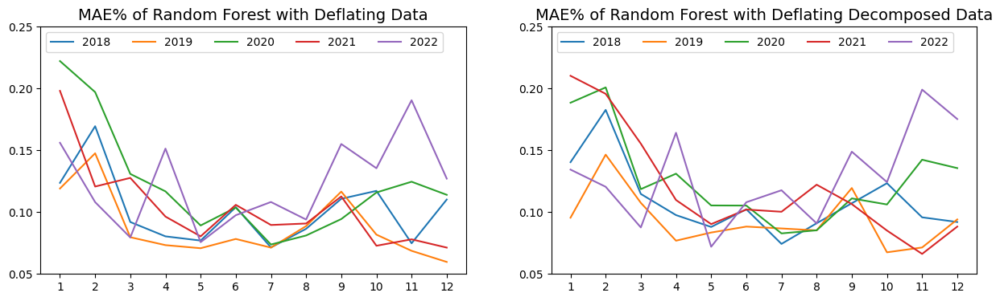

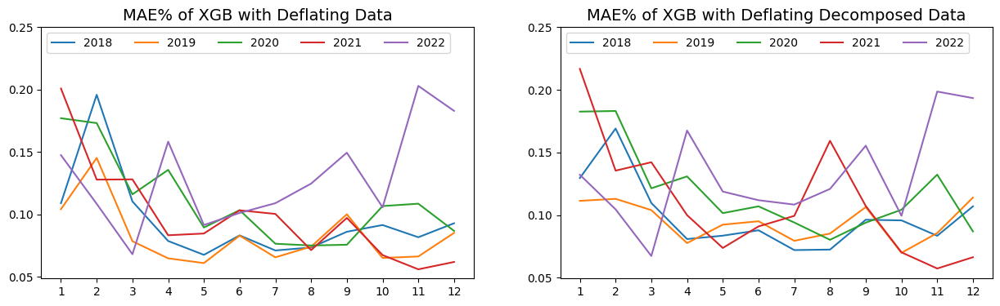

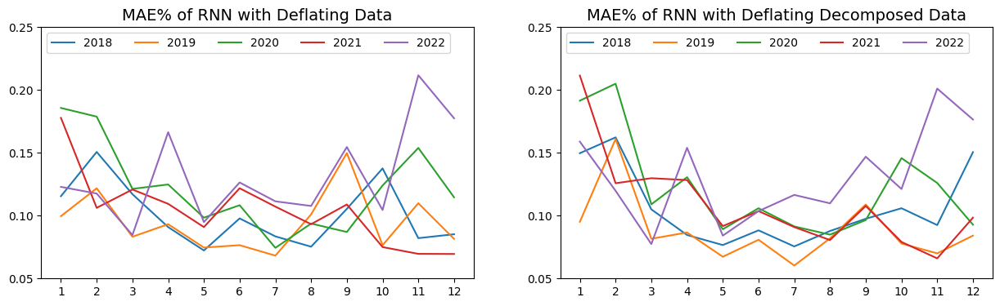

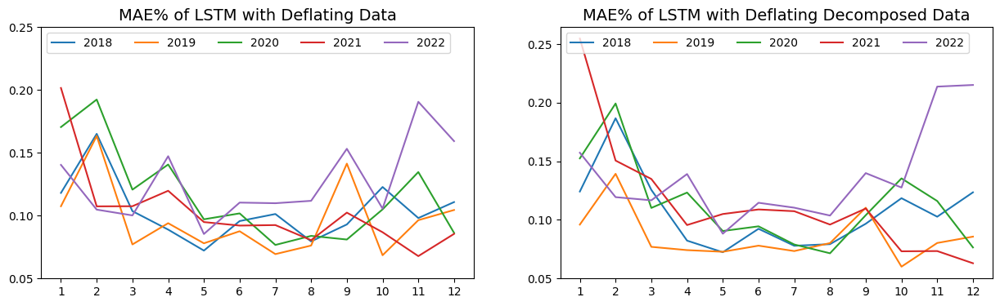

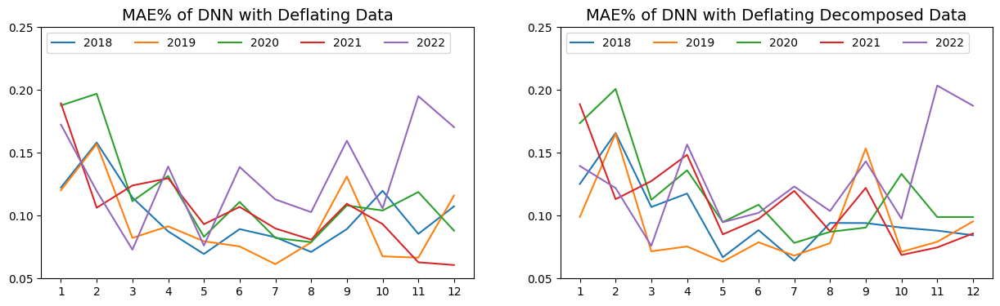

In [50]:
# Original
plotModelScoreByYear('Random Forest', mae_p, 'MAE%', True)
plotModelScoreByYear('XGB', mae_p, 'MAE%', True)
plotModelScoreByYear('RNN', mae_p, 'MAE%', True)
plotModelScoreByYear('LSTM', mae_p, 'MAE%', True)
plotModelScoreByYear('DNN', mae_p, 'MAE%', True)

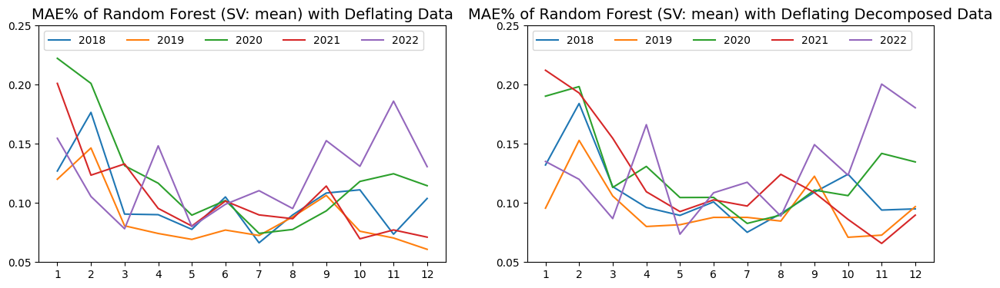

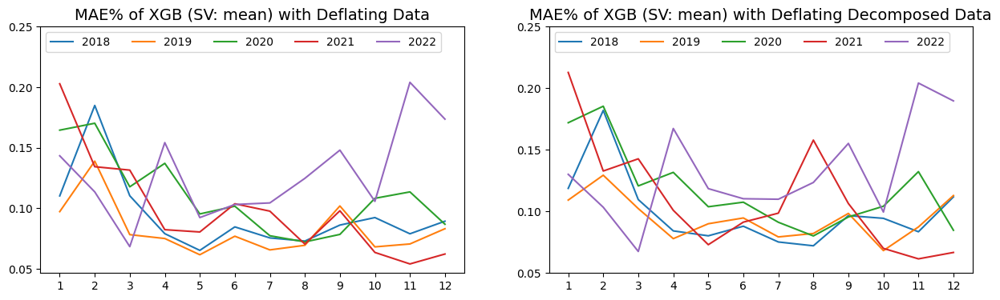

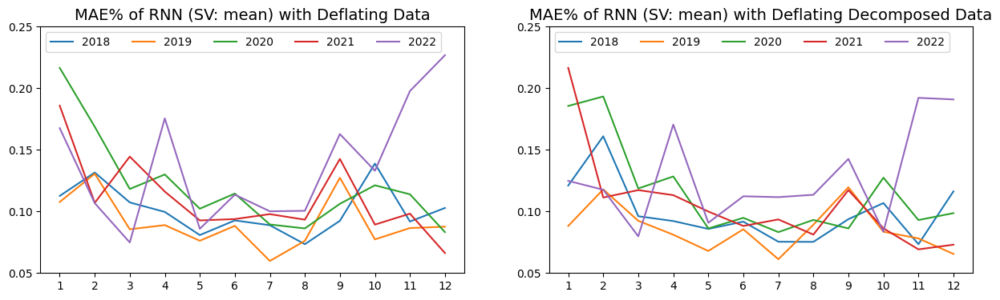

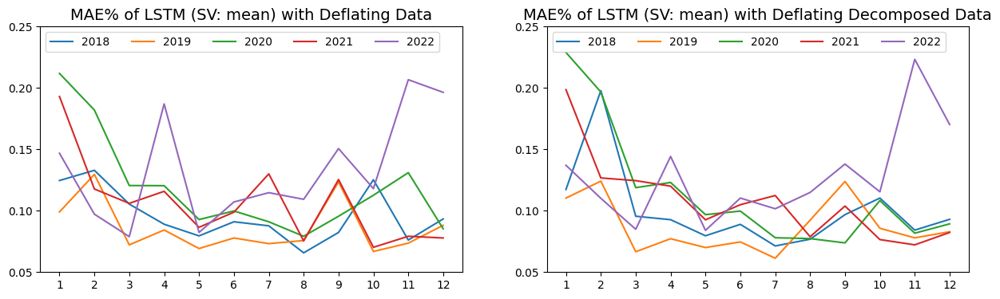

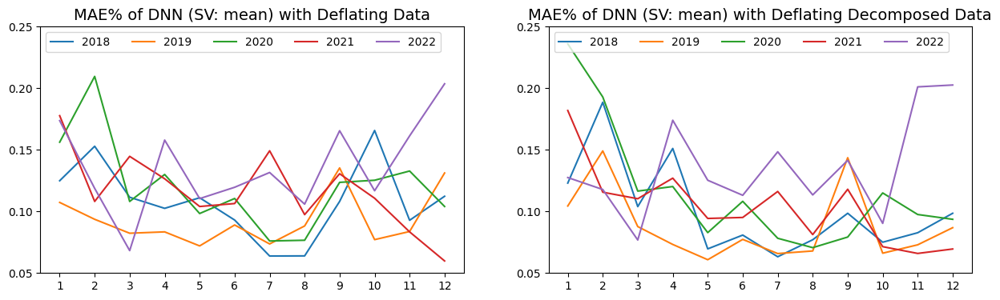

In [51]:
# Search volume: mean
plotModelScoreByYear('Random Forest', mae_p, 'MAE%', True, sv = True, sv_type = 'mean')
plotModelScoreByYear('XGB', mae_p, 'MAE%', True, sv = True, sv_type = 'mean')
plotModelScoreByYear('RNN', mae_p, 'MAE%', True, sv = True, sv_type = 'mean')
plotModelScoreByYear('LSTM', mae_p, 'MAE%', True, sv = True, sv_type = 'mean')
plotModelScoreByYear('DNN', mae_p, 'MAE%', True, sv = True, sv_type = 'mean')

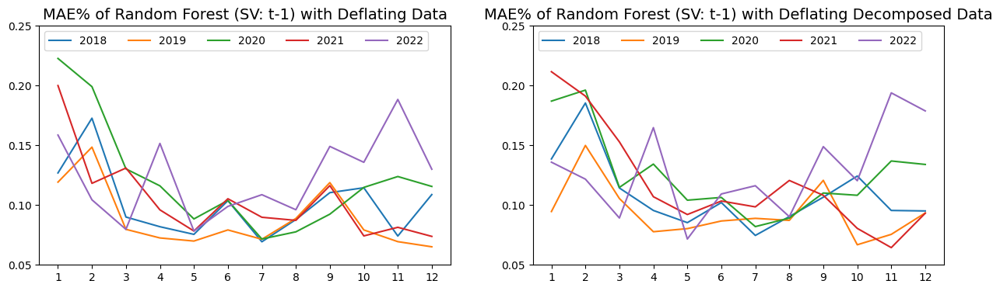

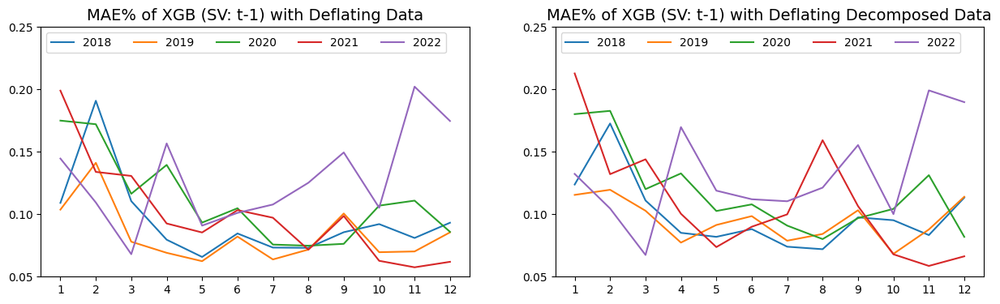

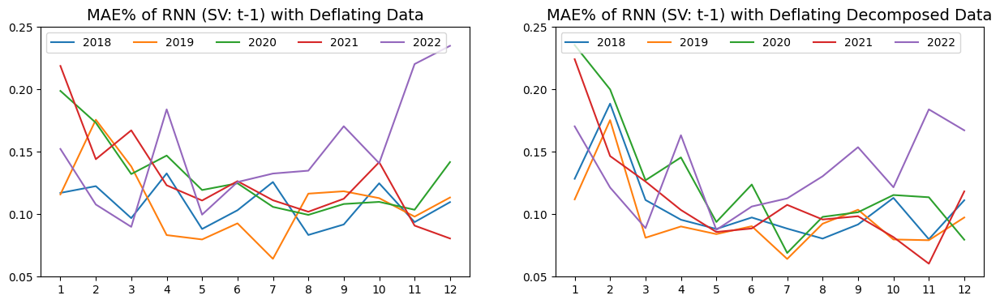

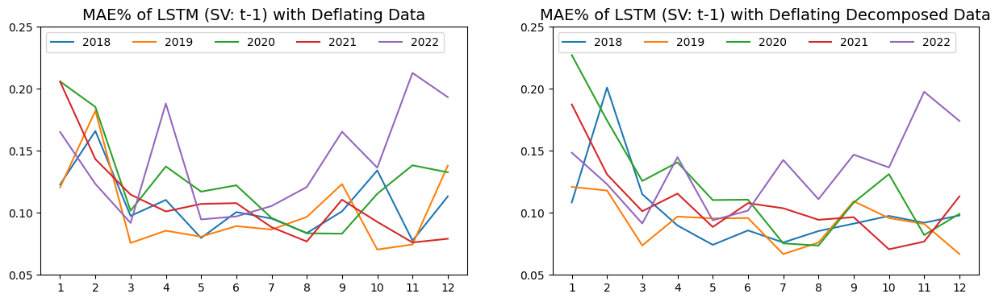

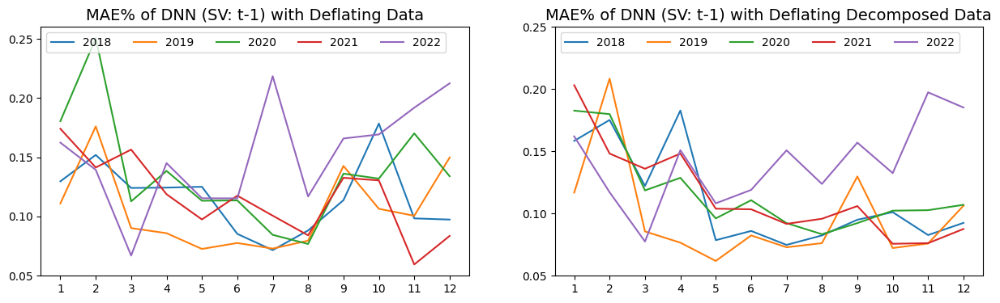

In [52]:
# Search volume: t-1
plotModelScoreByYear('Random Forest', mae_p, 'MAE%', True, sv = True, sv_type = 't-1')
plotModelScoreByYear('XGB', mae_p, 'MAE%', True, sv = True, sv_type = 't-1')
plotModelScoreByYear('RNN', mae_p, 'MAE%', True, sv = True, sv_type = 't-1')
plotModelScoreByYear('LSTM', mae_p, 'MAE%', True, sv = True, sv_type = 't-1')
plotModelScoreByYear('DNN', mae_p, 'MAE%', True, sv = True, sv_type = 't-1')

### **3.4 Plot Benchmark by Year**

2023.06.01

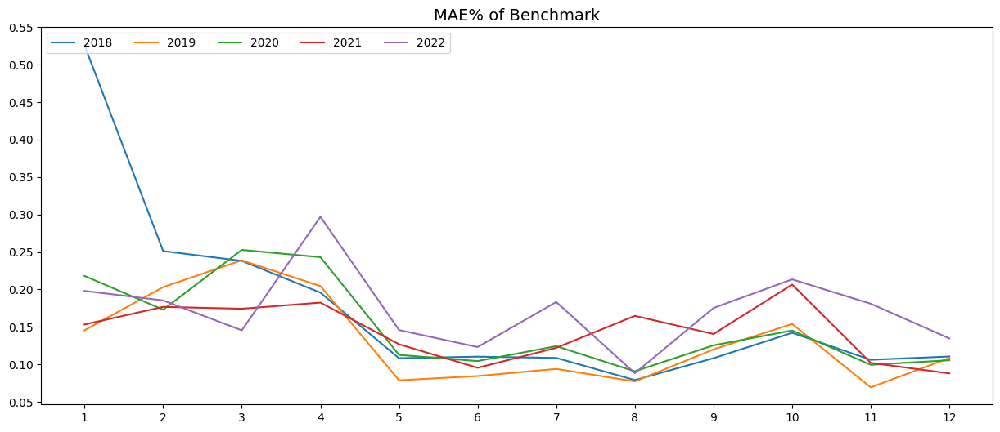

In [ ]:
plotBenchmarkScoreByYear(mae_p, 'MAE%', True)

### **3.5 Comparison of `Search Volume - Mean` and `Search Volume - t-1`**

2023.06.14

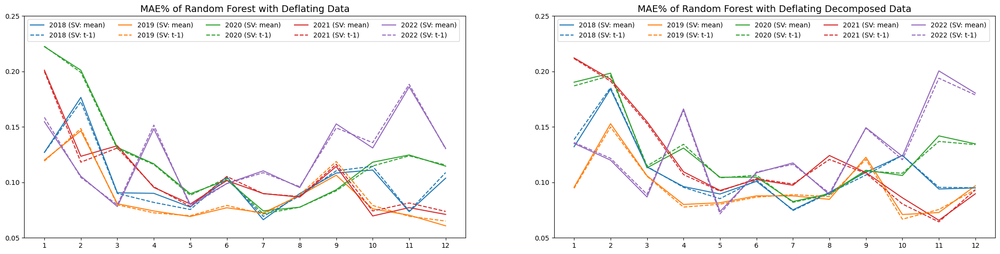

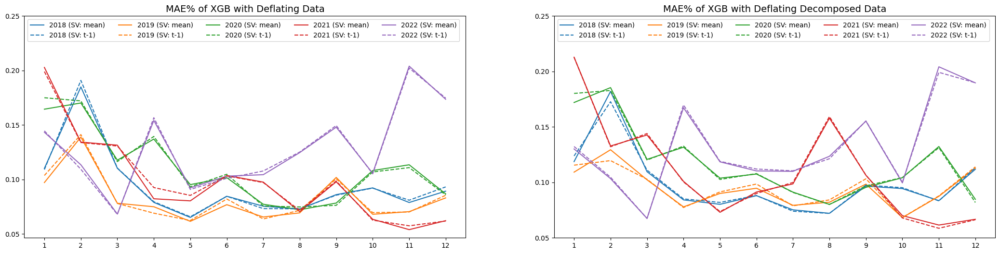

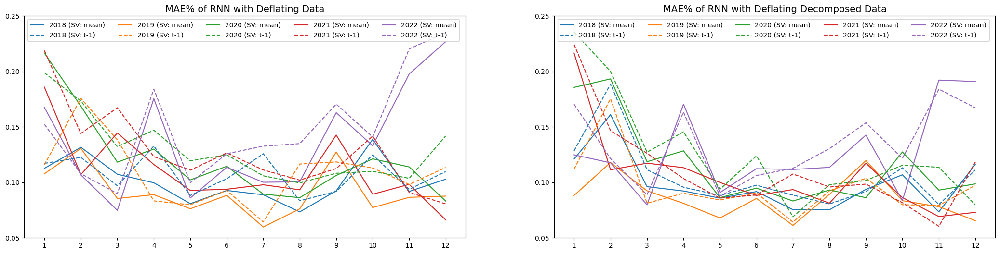

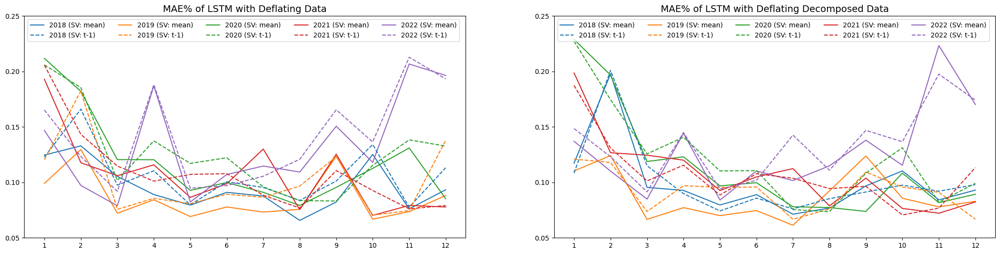

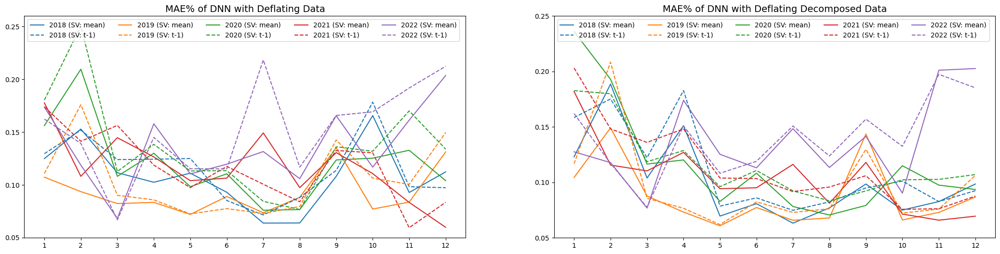

In [53]:
plotModelScoreComparisonByYear('Random Forest', mae_p, 'MAE%', True, sv_1 = True, sv_type_1 = 'mean', sv_2 = True, sv_type_2 = 't-1')
plotModelScoreComparisonByYear('XGB', mae_p, 'MAE%', True, sv_1 = True, sv_type_1 = 'mean', sv_2 = True, sv_type_2 = 't-1')
plotModelScoreComparisonByYear('RNN', mae_p, 'MAE%', True, sv_1 = True, sv_type_1 = 'mean', sv_2 = True, sv_type_2 = 't-1')
plotModelScoreComparisonByYear('LSTM', mae_p, 'MAE%', True, sv_1 = True, sv_type_1 = 'mean', sv_2 = True, sv_type_2 = 't-1')
plotModelScoreComparisonByYear('DNN', mae_p, 'MAE%', True, sv_1 = True, sv_type_1 = 'mean', sv_2 = True, sv_type_2 = 't-1')

### **3.6 Comparison of `Original` and `Search Volume - Mean`**

2023.06.14

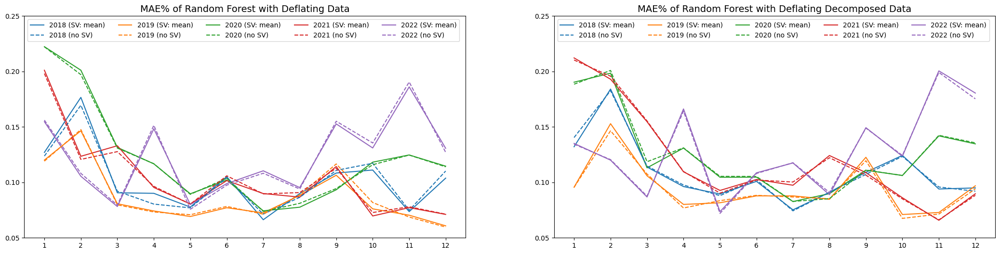

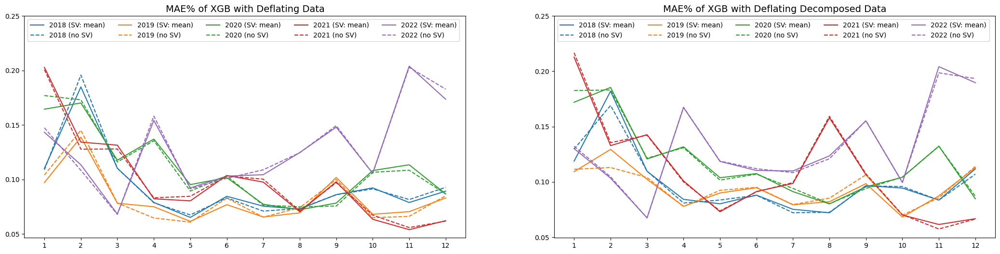

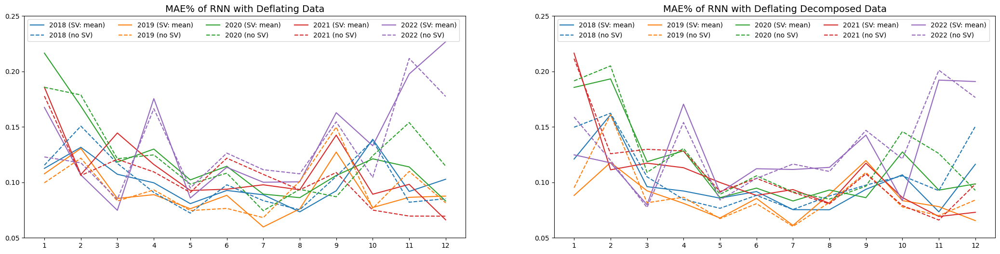

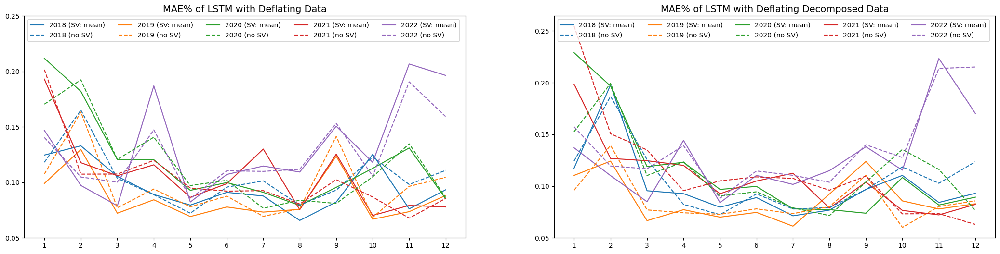

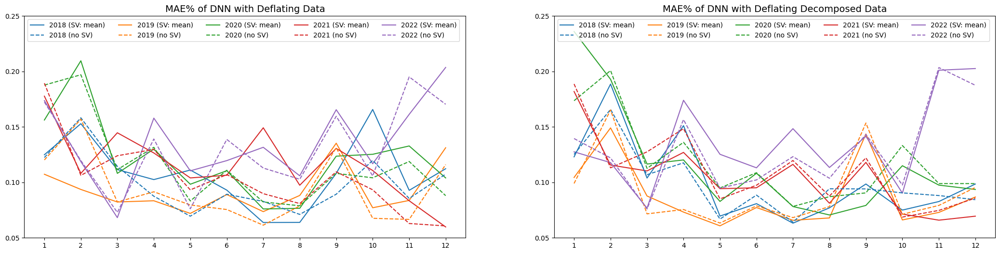

In [54]:
plotModelScoreComparisonByYear('Random Forest', mae_p, 'MAE%', True, sv_1 = True, sv_type_1 = 'mean')
plotModelScoreComparisonByYear('XGB', mae_p, 'MAE%', True, sv_1 = True, sv_type_1 = 'mean')
plotModelScoreComparisonByYear('RNN', mae_p, 'MAE%', True, sv_1 = True, sv_type_1 = 'mean')
plotModelScoreComparisonByYear('LSTM', mae_p, 'MAE%', True, sv_1 = True, sv_type_1 = 'mean')
plotModelScoreComparisonByYear('DNN', mae_p, 'MAE%', True, sv_1 = True, sv_type_1 = 'mean')

### **3.7 Compare the Mean Scores of Top Models**

2023.06.15

In [55]:
mae_p_top_compare = compareTopModel(mae_p_top)
mae_p_top_compare

,Model,Data Type,mean,mean of SV - mean,mean of SV - t-1
0,Random Forest,def,0.1077,0.1074,0.1077
1,Random Forest,dec_def,0.1153,0.1157,0.1150
2,XGB,def,0.1031,0.1026,0.1033
3,XGB,dec_def,0.1106,0.1105,0.1107
4,RNN,def,0.1107,0.1121,0.1248
5,RNN,dec_def,0.1114,0.1067,0.1145
6,LSTM,def,0.1094,0.1080,0.1170
7,LSTM,dec_def,0.1113,0.1075,0.1113
8,DNN,def,0.1090,0.1150,0.1251
9,DNN,dec_def,0.1095,0.1089,0.1158


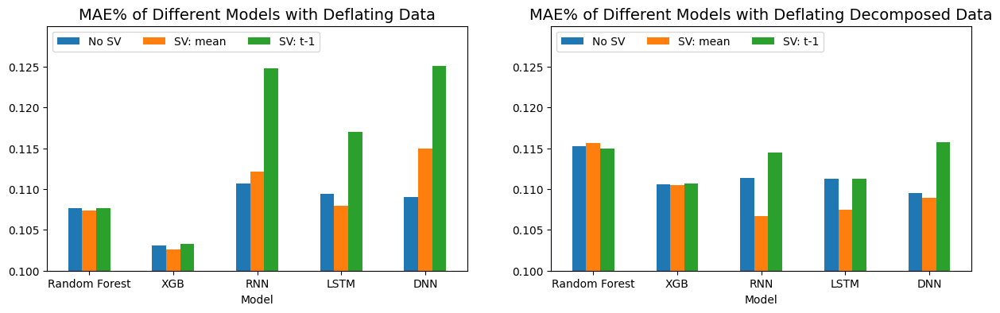

In [56]:
# Plot
plotCompareTopModel(mae_p_top_compare, 'MAE%', percent = True)

## **4. Plot Monthly Revenue by Year**

In [ ]:
project_path = '/content/gdrive/Shareddrives/Me/論文'

In [ ]:
org_data = pd.read_excel(os.path.join(project_path, '資料集/007_v1/201301-202212上市櫃公司月營收_非金融業.xlsx'), index_col=0)
org_data.columns = pd.to_datetime(org_data.columns, format="%Y-%m-%d").to_period('M')
org_data

,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,...,2022-03,2022-04,2022-05,2022-06,2022-07,2022-08,2022-09,2022-10,2022-11,2022-12
公司,,,,,,,,,,,,,,,,,,,,,
1101 台泥,9134465,5540346,9457971,9919269,9543782,9517630,9875888,9835143,10060975,10654077,...,9971650,8319342,7733787,9145989,10102468,10689860,10404901,11368096,9674576,12584154
1102 亞泥,6018213,2552357,5428755,5930748,6239676,5952754,5942364,5786107,5879394,6478670,...,8160414,8710220,8000427,7776413,7864622,7069221,6994078,7601097,8306062,8340507
1103 嘉泥,288455,166638,286007,365292,382601,302995,294781,336088,314563,429783,...,220463,168089,163521,183177,178825,182371,205264,209429,221763,228644
1104 環泥,486481,299860,461732,394631,406677,415968,453397,393203,448691,521445,...,591593,638493,537082,573028,580420,605512,597159,634981,631827,725055
1108 幸福,481802,276936,444917,362054,381384,368109,439572,379115,387362,450770,...,345612,335518,332258,334113,326691,390053,346635,401202,383773,418326
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9951 皇田,201785,167967,240746,243935,238296,193880,198427,256724,228796,250756,...,374229,302262,323433,371791,337581,468608,464373,432835,500111,506796
9955 佳龍,394489,383183,428478,564053,336622,295391,434605,306534,266617,363766,...,96200,101850,95096,80726,85625,81881,79179,80630,91270,84115
9958 世紀鋼,198944,166364,351222,280864,289332,426371,213281,302589,401695,255738,...,626104,401960,673479,665459,651699,757968,903198,911834,944060,1082675


In [ ]:
def plotMonthlyRevenueByYear(data: pd.Series):
    months = list(range(1,13))
    # Plot
    plt.figure(figsize = (15,8))
    plt.title("Average Monthly Revenue (2018-2022)", size = 14)
    # plt.plot(months, data[0:12], label = '2013')
    # plt.plot(months, data[12:24], label = '2014')
    # plt.plot(months, data[24:36], label = '2015')
    # plt.plot(months, data[36:48], label = '2016')
    # plt.plot(months, data[48:60], label = '2017')
    plt.plot(months, data[60:72], label = '2018')
    plt.plot(months, data[72:84], label = '2019')
    plt.plot(months, data[84:96], label = '2020')
    plt.plot(months, data[96:108], label = '2021')
    plt.plot(months, data[108:120], label = '2022')
    plt.xticks(months)
    # plt.yticks(range(100000, 600000, 50000))
    plt.legend(ncol=5, loc = 'upper left')
    plt.show()

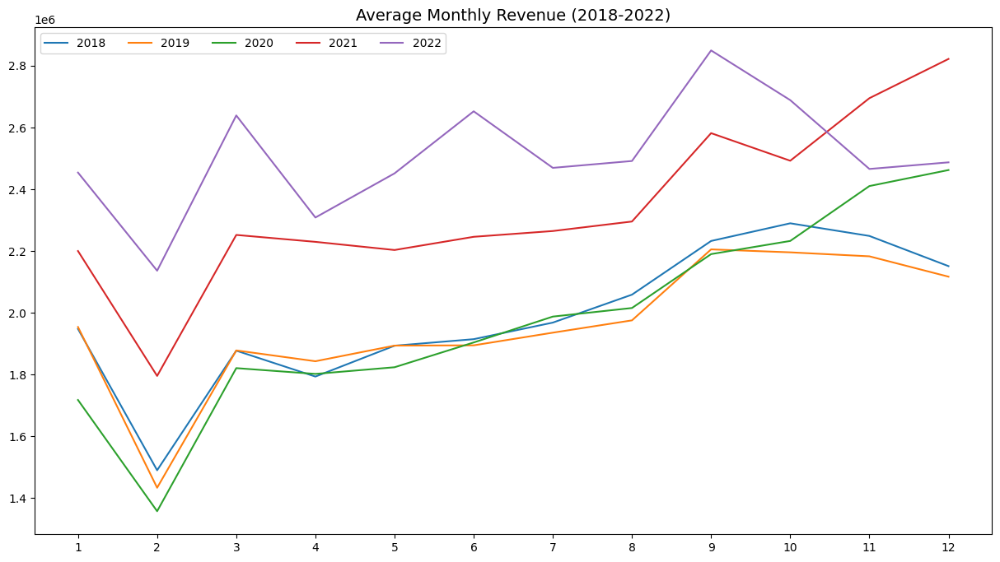

In [ ]:
plotMonthlyRevenueByYear(org_data.mean())